In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
df=pd.read_csv("digit_train.csv")
df.head(10)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

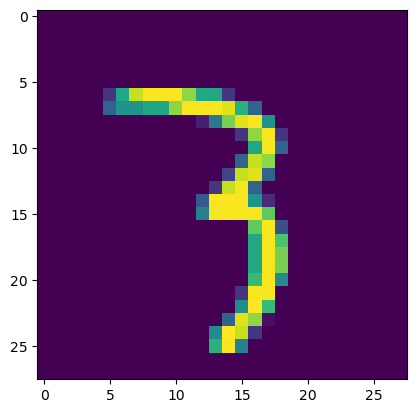

In [68]:
plt.imshow(df.iloc[13038,1:].values.reshape(28,28))

In [5]:
X=df.iloc[:,1:]
y=df.iloc[:,0]

In [6]:
#Train and test data split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [7]:
#Shape after splitting
X_train.shape

(33600, 784)

In [8]:
#Creating an object for KNN algorithm
knn=KNeighborsClassifier()

In [9]:
# training the model before appling PCA
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [10]:
# Predicting the model & calculating model prediction time with high dimentional features
import time
start=time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

10.256496906280518


In [11]:
# model accuracy before PCA
accuracy_score(y_test,y_pred)

0.9648809523809524

# Principal Component Analysis to reduce dimentionality of the images

In [12]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [13]:
#Randomly selecting no.of PCA axis 
pca=PCA(n_components=200)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [14]:
# Model training and prediction after features selection
knn.fit(X_train_trf,y_train)
y_pred_trf=knn.predict(X_test_trf)
        

In [15]:
accuracy_score(y_test,y_pred_trf)

0.9501190476190476

In [16]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig=px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10
              )
fig.show()

In [17]:
# Analysing other component of PCA
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf

array([[-2.71865565, -0.48994698,  1.13562112],
       [-0.67694051, -6.75391248, -2.33552903],
       [-3.03320511,  6.50963403,  7.49180596],
       ...,
       [ 2.14880713,  0.78126139, -0.74763121],
       [ 1.05950946,  0.94781619,  3.9496601 ],
       [17.70260942,  1.96195952, -4.94366354]])

In [64]:
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(df,x=X_train_trf[:,0],y=X_train_trf[:,1],z=X_train_trf[:,2],
                 color=y_train_trf)
fig.update_layout(
    margin=dict(l=20,r=20,t=20,b=20)
)
fig.show()

In [18]:
pca.explained_variance_
#Eigen values

array([40.67111197, 29.17023391, 26.74459609])

In [19]:
pca.components_
#eigen vectors

array([[-1.71900766e-17,  1.94072259e-19, -5.49788367e-20, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-4.02034278e-17,  4.20013404e-18, -1.32668092e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.09021371e-16, -3.61413417e-18,  1.11854156e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [56]:
# How to select best componets for PCA ==> select the components which carry 90% of varience in the data using this techniq
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

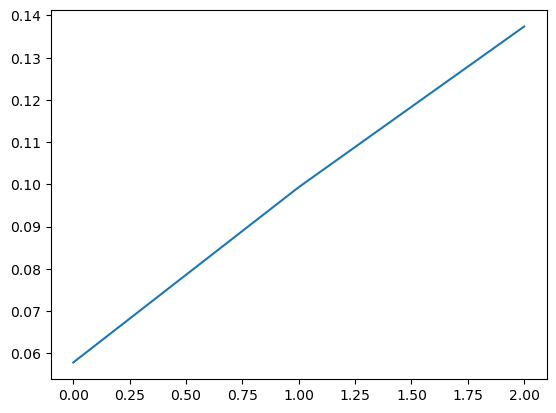

In [20]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
#using this graph pic the one where 90% variance starts explaining in the data